<a href="https://colab.research.google.com/github/longhowlam/python_hobby_stuff/blob/master/geopandas_maps.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Interactive maps with geopandas 

Gegeven een shape file kunnen we met geopandas een interactieve plot maken en daar ook weer punten op zetten. 

Zie [Geopandas explore ](https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.explore.html)

Benodigde extra packages als we op colab willen runnen

In [ ]:
!pip install geopandas
!pip install matplotlib mapclassify pyproj
!pip install folium -U

In [3]:
from urllib.request import urlopen
import json
import plotly.express as px
import pandas as pd
import geopandas as gpd
import folium
import json

from pyproj import CRS

## buurt kaarten shape files van CBS

Zie [CBS data](https://www.cbs.nl/nl-nl/dossier/nederland-regionaal/geografische-data/wijk-en-buurtkaart-2021)

In [ ]:
!wget https://www.cbs.nl/-/media/cbs/dossiers/nederland-regionaal/wijk-en-buurtstatistieken/wijkbuurtkaart_2021_v1.zip
!unzip wijkbuurtkaart_2021_v1.zip

In [6]:
####  Laad de CBS buurt shape file en converteer naar juiste coordinaatsysteem
####  heel nederland is te groot om goed te plotten.
####  focus op Amsterdam en de buurten met meer dan 200 inwoners

fp = "WijkBuurtkaart_2021_v1/buurt_2021_v1.shx"
amsterdam = (
    gpd.read_file(fp)
    .to_crs(CRS.from_epsg(4326))
    .query('GM_NAAM =="Amsterdam" ')
    .query('AANT_INW > 200')
    .dropna()
)
amsterdam.sample(3)

,BU_CODE,BU_NAAM,WK_CODE,GM_CODE,GM_NAAM,IND_WBI,H2O,POSTCODE,DEK_PERC,OAD,STED,BEV_DICHTH,AANT_INW,AANT_MAN,AANT_VROUW,P_00_14_JR,P_15_24_JR,P_25_44_JR,P_45_64_JR,P_65_EO_JR,P_ONGEHUWD,P_GEHUWD,P_GESCHEID,P_VERWEDUW,AANTAL_HH,P_EENP_HH,P_HH_Z_K,P_HH_M_K,GEM_HH_GR,P_WEST_AL,P_N_W_AL,P_MAROKKO,P_ANT_ARU,P_SURINAM,P_TURKIJE,P_OVER_NW,OPP_TOT,OPP_LAND,OPP_WATER,JRSTATCODE,JAAR,Shape_Leng,Shape_Area,geometry
4318,BU03634101,Jan Maijenbuurt,WK036341,GM0363,Amsterdam,1,NEE,1056,1,9330,1,28555,2235,1055,1180,11,12,43,25,9,70,18,9,2,1335,58,23,19,1.7,16,45,13,0,7,11,13,8,8,0,2021BU03634101,2021,1129.723398,78375.582160,"POLYGON ((4.85257 52.37305, 4.85360 52.37082, ..."
4329,BU03634402,Aalsmeerwegbuurt West,WK036344,GM0363,Amsterdam,1,NEE,1059,1,6471,1,25789,2520,1155,1365,11,8,53,19,8,73,20,6,1,1480,50,33,17,1.7,25,17,2,0,2,1,11,11,10,1,2021BU03634402,2021,1435.617417,105233.447229,"POLYGON ((4.84946 52.35004, 4.84944 52.34996, ..."
4541,BU03638903,Medisch Centrum Slotervaart,WK036389,GM0363,Amsterdam,1,NEE,1066,1,2366,2,2752,795,420,375,6,45,35,7,7,85,6,7,2,640,90,4,6,1.2,24,39,11,0,5,3,20,30,29,1,2021BU03638903,2021,2297.694660,301902.155634,"POLYGON ((4.82742 52.35181, 4.82748 52.34880, ..."


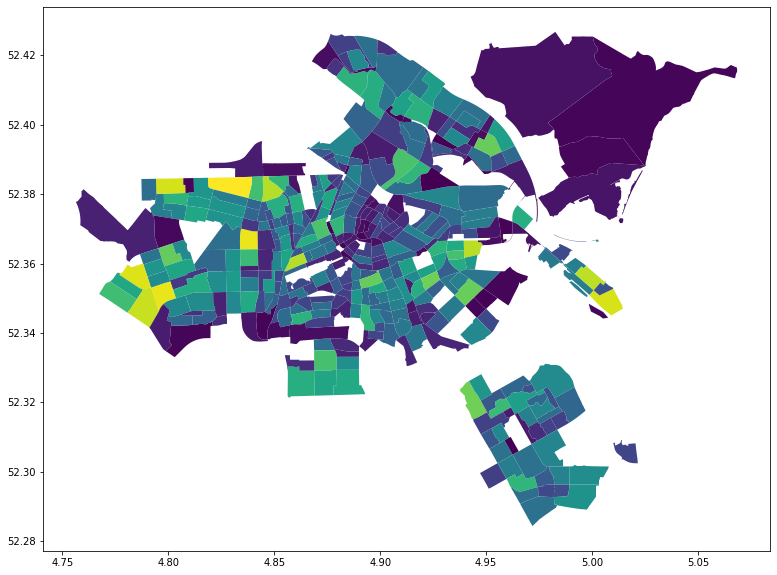

In [7]:
### statisch plaatje
amsterdam.plot('AANT_INW', figsize=(20, 10))

In [8]:
### interactive plaatje met folium
m = amsterdam.explore(
    column = 'AANT_INW',
    tooltip= ['BU_NAAM', 'BEV_DICHTH', 'AANT_INW'],
    width = 700,
    height = 600
)
m

## Punten om op bovenstaande map te zetten. 
Neem de lijst met locaties van parkeergarages in Amsterdam, is open data

In [ ]:
!wget -O parkeer_locaties.json https://api.data.amsterdam.nl/dcatd/datasets/KcbuTzpG6yRHvg/purls/KluYGmQQ2p5Yqw

In [11]:
with open('parkeer_locaties.json') as json_file:
    parkeer_locaties = json.load(json_file)

In [20]:
### we hebben nu een dict met parkeer locaties
parkeer_locaties['parkeerlocaties'][0:4]

[{'parkeerlocatie': {'Locatie': '{"type":"Point","coordinates":[4.9032801,52.3824545]}',
   'adres': 'Buiksloterweg 3',
   'opmerkingen': 'Alleen toegankelijk voor abonnementhouders van Tolhuisplein, automatische stalling',
   'postcode': '1031 CC',
   'title': 'Fietsenstalling Tolhuisplein',
   'type': 'Fietspunt',
   'url': 'https://www.amsterdam.nl/parkeren-verkeer/fiets/fietsparkeren/gemeentelijke/',
   'urltitle': 'www.amsterdam.nl/fiets',
   'woonplaats': 'Amsterdam'}},
 {'parkeerlocatie': {'Locatie': '{"type":"Point","coordinates":[4.8833735,52.3621851]}',
   'adres': 'Weteringschans 4 A',
   'opmerkingen': 'Maximale parkeerduur 28 dagen, stalling met toezicht',
   'postcode': '1017 SG',
   'title': 'Fietsenstalling Paradiso',
   'type': 'Fietspunt',
   'url': 'https://www.amsterdam.nl/parkeren-verkeer/fiets/fietsparkeren/gemeentelijke/',
   'urltitle': 'www.amsterdam.nl/fiets',
   'woonplaats': 'Amsterdam'}},
 {'parkeerlocatie': {'Locatie': '{"type":"Point","coordinates":[4.871

In [21]:
#### use json_normalize to get each location into a row in a pandas dataframe
parkeer_locaties_df = pd.json_normalize(parkeer_locaties['parkeerlocaties'])
parkeer_locaties_df.columns = parkeer_locaties_df.columns.str.replace('.', '_')

In [22]:
parkeer_locaties_df.sample(4)

,parkeerlocatie_title,parkeerlocatie_Locatie,parkeerlocatie_type,parkeerlocatie_url,parkeerlocatie_urltitle,parkeerlocatie_adres,parkeerlocatie_postcode,parkeerlocatie_woonplaats,parkeerlocatie_opmerkingen,parkeerlocatie_OV_bus,parkeerlocatie_OV_tram,parkeerlocatie_OV,parkeerlocatie_OV_metro,parkeerlocatie_OV_trein,parkeerlocatie_aantal
57,Parkeergarage IJdock,"{""type"":""Point"",""coordinates"":[4.8949157,52.38...",CommercieleParkeergarage,http://www.parkereninijdock.nl,Parkeergarage IJdock,IJdok 33,1013 MM,Amsterdam,,NaN,NaN,NaN,NaN,NaN,350
28,Stadhuis - Muziektheater,"{""type"":""Point"",""coordinates"":[4.9018035,52.36...",Parkeergarage,https://www.amsterdam.nl/parkeren-verkeer/park...,Bekijk Stadhuis-Muziektheater op www.amsterda...,Waterlooplein 28,1011PG,Amsterdam,,NaN,NaN,NaN,NaN,NaN,NaN
33,Parkeergarage Apcoa Heinekenplein,"{""type"":""Point"",""coordinates"":[4.8924871,52.35...",CommercieleParkeergarage,https://www.apcoa.nl/parkeerplaats/amsterdam/a...,Apcoa garage Heinekenplein,Eerste Van der Helststraat 6,1072NV,Amsterdam,,NaN,NaN,NaN,NaN,NaN,NaN
66,Parkbee - Westerdok,"{""type"":""Point"",""coordinates"":[4.8898719,52.38...",CommercieleParkeergarage,https://parkbee.com/nl/parkeergarage/westerdok,Website Parkbee - Westerdok,Grote Bickersstraat 74,1013 KS,Amsterdam,,NaN,NaN,NaN,NaN,NaN,100


We moeten de long lat uit de parkeer_Locatie kolom halen en dat als POINT in een geopandas data frame zetten

In [ ]:
##json.loads(parkeer_locaties_df['parkeerlocatie_Locatie'][0])['coordinates']

[4.9032801, 52.3824545]

In [28]:
parkeer_locaties_df ['lon'], parkeer_locaties_df[ 'lat'] = zip( *parkeer_locaties_df.parkeerlocatie_Locatie.apply(lambda x : json.loads(x)['coordinates']))
parkeer_locaties_df = gpd.GeoDataFrame(parkeer_locaties_df, geometry= gpd.points_from_xy(parkeer_locaties_df ['lon'], parkeer_locaties_df[ 'lat']))

In [29]:
parkeer_locaties_df

,parkeerlocatie_title,parkeerlocatie_Locatie,parkeerlocatie_type,parkeerlocatie_url,parkeerlocatie_urltitle,parkeerlocatie_adres,parkeerlocatie_postcode,parkeerlocatie_woonplaats,parkeerlocatie_opmerkingen,parkeerlocatie_OV_bus,parkeerlocatie_OV_tram,parkeerlocatie_OV,parkeerlocatie_OV_metro,parkeerlocatie_OV_trein,parkeerlocatie_aantal,lon,lat,geometry
0,Fietsenstalling Tolhuisplein,"{""type"":""Point"",""coordinates"":[4.9032801,52.38...",Fietspunt,https://www.amsterdam.nl/parkeren-verkeer/fiet...,www.amsterdam.nl/fiets,Buiksloterweg 3,1031 CC,Amsterdam,Alleen toegankelijk voor abonnementhouders van...,NaN,NaN,NaN,NaN,NaN,NaN,4.903280,52.382455,POINT (4.90328 52.38245)
1,Fietsenstalling Paradiso,"{""type"":""Point"",""coordinates"":[4.8833735,52.36...",Fietspunt,https://www.amsterdam.nl/parkeren-verkeer/fiet...,www.amsterdam.nl/fiets,Weteringschans 4 A,1017 SG,Amsterdam,"Maximale parkeerduur 28 dagen, stalling met to...",NaN,NaN,NaN,NaN,NaN,NaN,4.883374,52.362185,POINT (4.88337 52.36219)
2,Fietsenstalling Zuidplein,"{""type"":""Point"",""coordinates"":[4.8719467,52.33...",Fietspunt,https://www.amsterdam.nl/parkeren-verkeer/fiet...,www.amsterdam.nl/fiets,Zuidplein 5,1077 XV,Amsterdam,"Maximale parkeerduur 28 dagen, stalling met to...",NaN,NaN,NaN,NaN,NaN,NaN,4.871947,52.339864,POINT (4.87195 52.33986)
3,Fietsenstalling Station Rai (gesloten tot febr...,"{""type"":""Point"",""coordinates"":[4.8905079,52.33...",Fietspunt,https://www.amsterdam.nl/parkeren-verkeer/fiet...,www.amsterdam.nl/fiets,Europaboulevard 4,1083 AD,Amsterdam,Sluit voor renovatie op 21 juli 2018. Er zijn ...,NaN,NaN,NaN,NaN,NaN,NaN,4.890508,52.339392,POINT (4.89051 52.33939)
4,P+R Zeeburg I en II,"{""type"":""Point"",""coordinates"":[4.9607015,52.37...",P+R,https://www.amsterdam.nl/parkeren-verkeer/park...,www.amsterdam.nl/penr,Zuiderzeeweg 46 a,1095KJ,Amsterdam,,bus 37 Noord - Amstelstation vv,tram 26 Ijburg - Centraal Station vv,"tram;GVB_26_1;08240, bus;GVB_37_2;08134",NaN,NaN,NaN,4.960701,52.371963,POINT (4.96070 52.37196)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,Haardstee,"{""type"":""Point"",""coordinates"":[4.9522569,52.31...",Parkeergarage,https://www.amsterdam.nl/parkeren-verkeer/park...,Parkeergarage Haardstee,Haardstee 100,1102NE,Amsterdam,,NaN,NaN,NaN,NaN,NaN,NaN,4.952257,52.311210,POINT (4.95226 52.31121)
95,Hoptille,"{""type"":""Point"",""coordinates"":[4.9547267,52.30...",Parkeergarage,https://www.amsterdam.nl/parkeren-verkeer/park...,Parkeergarage Hoptille,Hoptille 100,1102PR,Amsterdam,,NaN,NaN,NaN,NaN,NaN,NaN,4.954727,52.309071,POINT (4.95473 52.30907)
96,Fietsenstalling Rokin,"{""type"":""Point"",""coordinates"":[4.8921686,52.36...",Fietspunt,https://www.amsterdam.nl/parkeren-verkeer/fiet...,www.amsterdam.nl/fiets,Rokin 127,1012 LC,Amsterdam,,NaN,NaN,NaN,NaN,NaN,NaN,4.892169,52.369219,POINT (4.89217 52.36922)
97,P+R Zeeburg III,"{""type"":""Point"",""coordinates"":[4.9723682,52.36...",P+R,https://www.amsterdam.nl/parkeren-verkeer/park...,www.amsterdam.nl/penr,Marie Baronlaan,1095 MV,Amsterdam,,bus 37 Noord - Amstelstation vv,tram 26 Ijburg - Centraal Station vv,tram;GVB_26_1;08009,NaN,NaN,265,4.972368,52.369987,POINT (4.97237 52.36999)


### Splitsting in fiets en auto parkeergarages

Zie voor icoontjes die je op de markers kunt gebruiken:
https://fontawesome.com/v5.15/icons?d=gallery&p=2

In [26]:
Fietspunt = parkeer_locaties_df.query("parkeerlocatie_type == 'Fietspunt'")
Autos = parkeer_locaties_df.query("parkeerlocatie_type != 'Fietspunt'")


In [27]:
## Kaart met buurt shapes en parkeerlocaties 

### maak interactive kaart met buurtshapes
m = amsterdam.explore(
    column = 'AANT_INW',
    tooltip = ['BU_NAAM', 'BEV_DICHTH', 'AANT_INW'],
    width =  1000,
    height = 800
)

### Zet fiets parkeergarages er op
m2 = Fietspunt.explore(
  m = m, 
  marker_type ='marker', 
  marker_kwds = dict( icon=folium.Icon(color="green", icon ="bicycle", prefix='fa')), 
  tooltip = "parkeerlocatie_title",
  tooltip_kwds = dict(labels=True), 
  name = "parkeerlocatie_title", 
  popup = ['parkeerlocatie_title', 'parkeerlocatie_type']
)

### Zet auto parkeergarages er op
m3 = Autos.explore(
  m = m2, 
  marker_type ='marker', 
  marker_kwds = dict( icon=folium.Icon(color="red",  icon ="car", prefix='fa')), 
  tooltip = "parkeerlocatie_title",
  tooltip_kwds = dict(labels=True), 
  name = "parkeerlocatie_title", 
  popup = ['parkeerlocatie_title', 'parkeerlocatie_type']
)

m3

In [ ]:
#### kaartje kan bewaard worden.
m3.save(outfile= "amsterdam_parkeergarages.html")